In [1]:
# Importing necessary libraries for data analysis and visualization
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# Importing Plotly Express library for creating interactive visualizations
import plotly.express as px
#Choose Gradient Boosting Regressor
from sklearn.ensemble import GradientBoostingRegressor
# Importing the RandomForestRegressor class from the sklearn.ensemble module
from sklearn.ensemble import RandomForestRegressor
# Importing the XGBRegressor class from the xgboost module
from xgboost import XGBRegressor
# Importing the DecisionTreeRegressor class from the sklearn.tree module
from sklearn.tree import DecisionTreeRegressor
# Import mean_absolute_error from sklearn.metrics
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

In [2]:
# Reading the training dataset from a CSV file and storing it in the variable train_data
train_data = pd.read_csv('/content/DS_MLxlsx - Training Dataset.csv')

In [3]:
# Reading the test dataset from a CSV file and storing it in the variable test_data
test_data = pd.read_csv('/content/DS_ML.xlsx - Test Dataset.csv')

In [4]:
# Display the first few rows of the training dataset
print("Training Dataset:")
print(train_data.head())

Training Dataset:
  ProductType Manufacturer Area Code Sourcing Channel Product Size  \
0        NTM3           X1       A28        WHOLESALE        Large   
1        NTM2           X1        A9           DIRECT        Large   
2        NTM3           X2       A20           DIRECT        Large   
3        NTM3           X1       A18        WHOLESALE        Small   
4        NTM2           X1       A28           DIRECT        Large   

  Product Type Month of Sourcing  Sourcing Cost  
0       Powder            May-21          10.16  
1       Powder            Oct-20         134.28  
2       Powder            Dec-20          12.46  
3       Powder            Feb-21         107.22  
4       Liquid            Nov-20         197.76  


In [5]:
# Display the first few rows of the test dataset
print("\nTest Dataset:")
print(test_data.head())


Test Dataset:
  ProductType Manufacturer Area Code Sourcing Channel Product Size  \
0        NTM1           X1        A1           DIRECT        Small   
1        NTM1           X1       A10           DIRECT        Large   
2        NTM1           X1       A10             ECOM        Large   
3        NTM1           X1       A11           DIRECT        Large   
4        NTM1           X1        A2           DIRECT        Large   

  Product Type Month of Sourcing  Sourcing Cost  
0       Powder            Jun-21         103.68  
1       Powder            Jun-21         155.75  
2       Powder            Jun-21         143.02  
3       Powder            Jun-21         139.39  
4       Powder            Jun-21         169.42  


In [6]:
# Check the shape of the datasets
print("\nTraining Dataset Shape:", train_data.shape)
print("\nTest Dataset Shape:", test_data.shape)


Training Dataset Shape: (550176, 8)

Test Dataset Shape: (96, 8)


In [7]:
# Check for missing values
print("\nMissing Values in Training Dataset:")
print(train_data.isnull().sum())
print("\nMissing Values in Testing Dataset:")
print(test_data.isnull().sum())


Missing Values in Training Dataset:
ProductType          0
Manufacturer         0
Area Code            0
Sourcing Channel     0
Product Size         0
Product Type         0
Month of Sourcing    0
Sourcing Cost        0
dtype: int64

Missing Values in Testing Dataset:
ProductType          0
Manufacturer         0
Area Code            0
Sourcing Channel     0
Product Size         0
Product Type         0
Month of Sourcing    0
Sourcing Cost        0
dtype: int64


In [8]:
# Displaying descriptive statistics for the training & testing data
print(train_data.describe())
print(test_data.describe())

       Sourcing Cost
count  550176.000000
mean      108.817286
std       104.390093
min      -196.070000
25%        57.000000
50%       132.000000
75%       146.150000
max     32632.500000
       Sourcing Cost
count      96.000000
mean      106.208021
std        52.359484
min         4.140000
25%        59.662500
50%       117.245000
75%       144.915000
max       234.710000


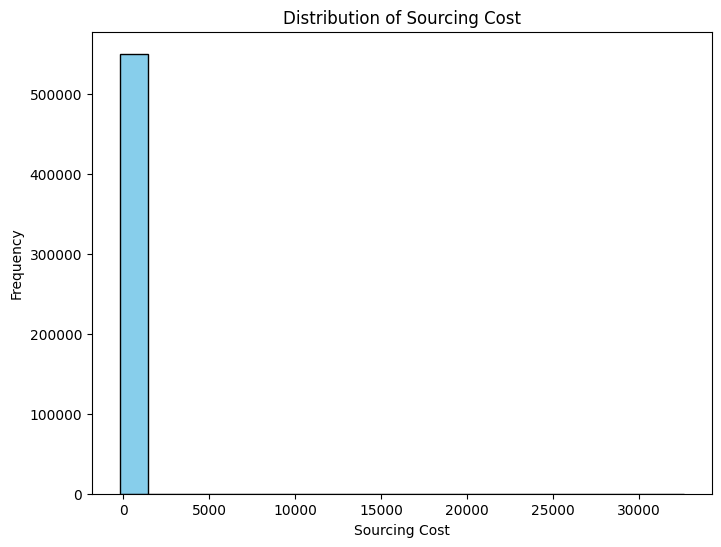

In [9]:
# Visualizations
# Creating a new figure with a specified size
plt.figure(figsize=(8, 6))

# Creating a histogram of the 'Sourcing Cost' column from the training data with 20 bins
plt.hist(train_data['Sourcing Cost'], bins=20, color='skyblue', edgecolor='black')

# Adding a title to the plot
plt.title('Distribution of Sourcing Cost')

# Adding labels to the x and y axes
plt.xlabel('Sourcing Cost')
plt.ylabel('Frequency')

# Displaying the plot
plt.show()


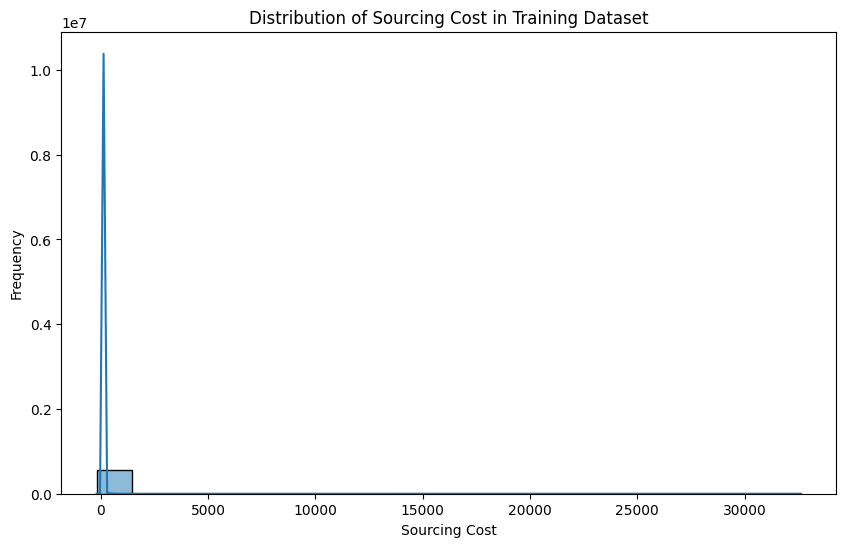

In [10]:
# Creating a new figure with a specified size
plt.figure(figsize=(10, 6))

# Creating a histogram of the 'Sourcing Cost' column from the training data with 20 bins and KDE (Kernel Density Estimation)
sns.histplot(train_data["Sourcing Cost"], bins=20, kde=True)

# Adding a title to the plot
plt.title("Distribution of Sourcing Cost in Training Dataset")

# Adding labels to the x and y axes
plt.xlabel("Sourcing Cost")
plt.ylabel("Frequency")

# Displaying the plot
plt.show()


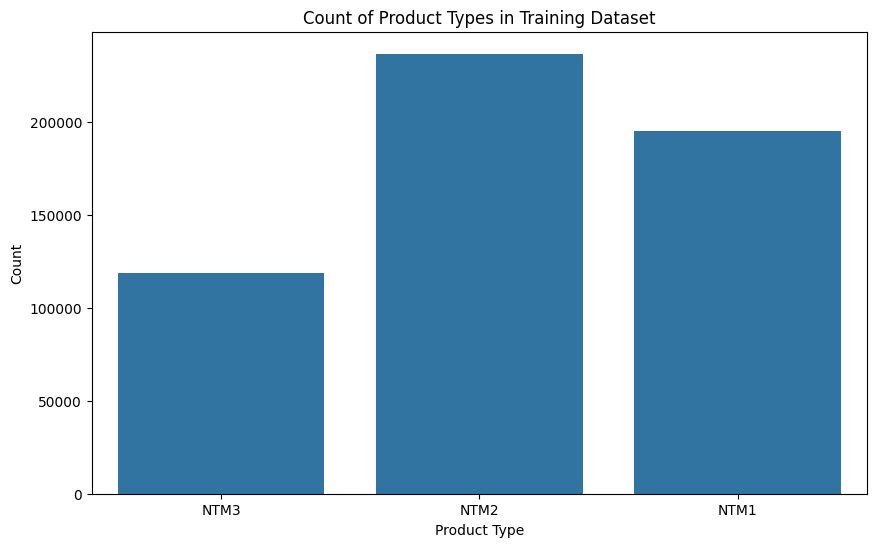

In [11]:
# Creating a new figure with a specified size
plt.figure(figsize=(10, 6))

# Creating a count plot of the 'ProductType' column from the training data
sns.countplot(x="ProductType", data=train_data)

# Adding a title to the plot
plt.title("Count of Product Types in Training Dataset")

# Adding labels to the x and y axes
plt.xlabel("Product Type")
plt.ylabel("Count")

# Displaying the plot
plt.show()

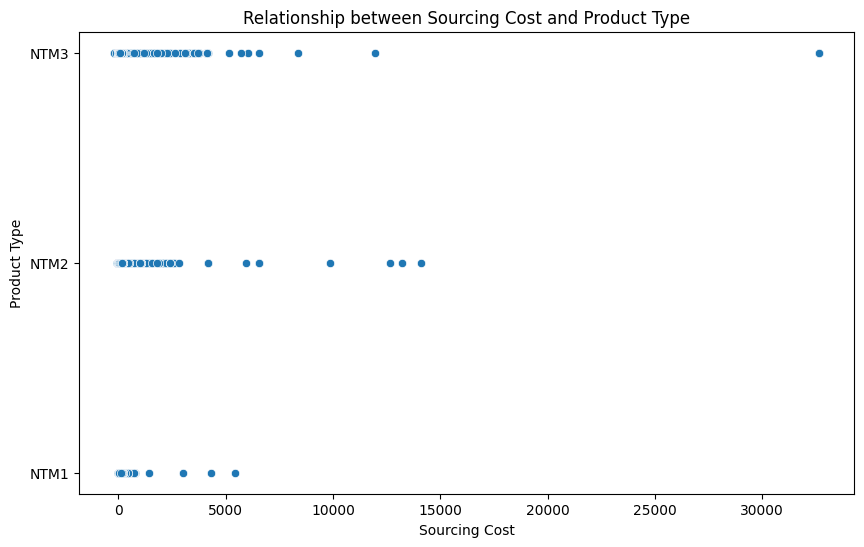

In [12]:
# Creating a new figure with a specified size
plt.figure(figsize=(10, 6))

# Creating a scatter plot to visualize the relationship between 'Sourcing Cost' and 'ProductType'
sns.scatterplot(x="Sourcing Cost", y="ProductType", data=train_data)

# Adding a title to the plot
plt.title("Relationship between Sourcing Cost and Product Type")
plt.xlabel("Sourcing Cost")
plt.ylabel("Product Type")
plt.show()

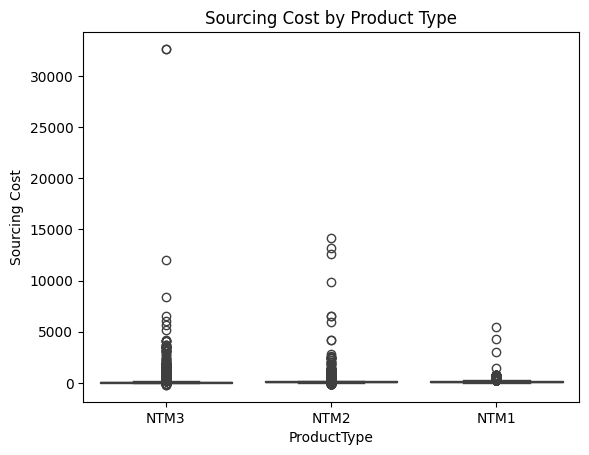

In [13]:
# Box plot for categorical vs numerical variable
sns.boxplot(x="ProductType", y="Sourcing Cost", data=train_data)
plt.title("Sourcing Cost by Product Type")
plt.show()

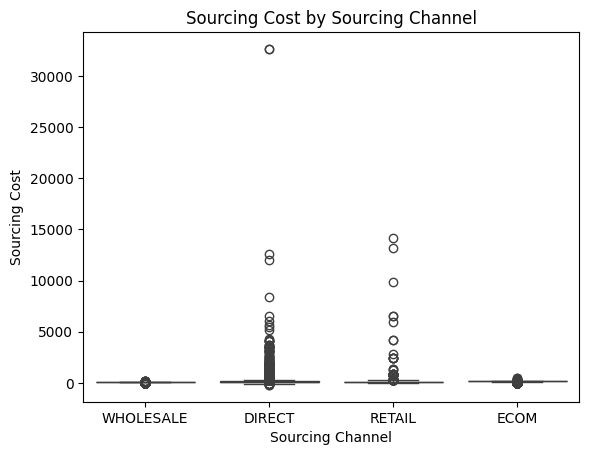

In [14]:
# Box plot to identify outliers
sns.boxplot(x="Sourcing Channel", y="Sourcing Cost", data=train_data)
plt.title("Sourcing Cost by Sourcing Channel")
plt.show()

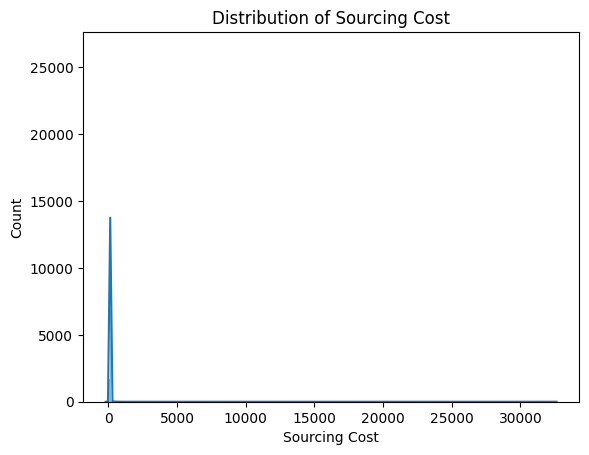

In [15]:
# Check for normality
# Creating a histogram of the 'Sourcing Cost' column from the training data with KDE (Kernel Density Estimation) enabled
sns.histplot(train_data["Sourcing Cost"], kde=True)
plt.title("Distribution of Sourcing Cost")
plt.show()

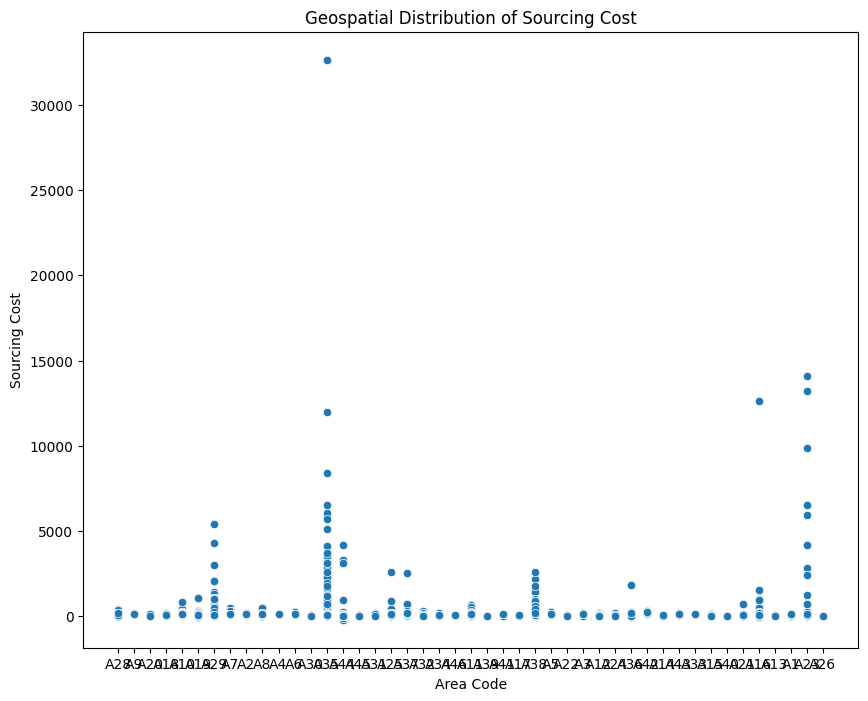

In [16]:
# Geospatial analysis (assuming Area Code represents geographical locations)
plt.figure(figsize=(10, 8))
# Creating a scatter plot to visualize the geospatial distribution of 'Sourcing Cost' based on 'Area Code'
sns.scatterplot(x="Area Code", y="Sourcing Cost", data=train_data)
plt.title("Geospatial Distribution of Sourcing Cost")
plt.xlabel("Area Code")
plt.ylabel("Sourcing Cost")
plt.show()

In [17]:
# Creating a scatter plot using Plotly Express, with 'Sourcing Cost' on the x-axis, 'Product Size' on the y-axis,
# color-coded by 'ProductType', and displaying additional information on hover for 'Manufacturer'
fig = px.scatter(train_data, x='Sourcing Cost', y='Product Size', color='ProductType', hover_data=['Manufacturer'])

fig.update_layout(
    title='Interactive Scatter Plot of Sourcing Cost vs Product Size',
    xaxis_title='Sourcing Cost',
    yaxis_title='Product Size'
)
fig.show()


In [18]:
# Convert 'Product Size' to numeric if it's not already
train_data['Product Size'] = pd.to_numeric(train_data['Product Size'], errors='coerce')

# Now, let's try creating the 'Total Cost' feature again
train_data['Total Cost'] = train_data['Sourcing Cost'] * train_data['Product Size']

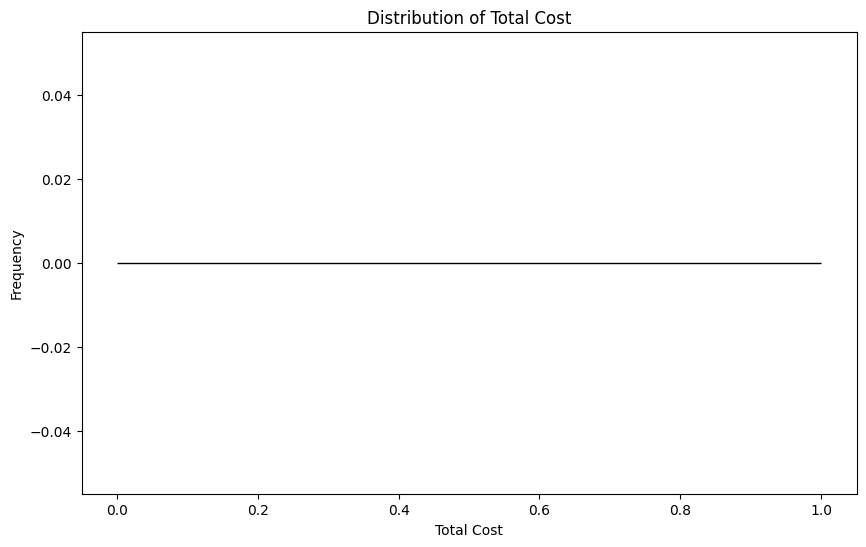

In [19]:
# Visualizing the distribution of the new feature
plt.figure(figsize=(10, 6))
sns.histplot(train_data['Total Cost'], kde=True)
plt.title('Distribution of Total Cost')
plt.xlabel('Total Cost')
plt.ylabel('Frequency')
plt.show()

In [20]:
# Check for missing values in the new feature
print("Missing Values in Total Cost:")
print(train_data['Total Cost'].isnull().sum())

# Summary statistics for the new feature
print("\nSummary Statistics for Total Cost:")
print(train_data['Total Cost'].describe())

Missing Values in Total Cost:
550176

Summary Statistics for Total Cost:
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: Total Cost, dtype: float64


In [21]:
# Feature Engineering: Creating a new feature 'Area Size' by combining 'Area Code' and 'Product Size'
train_data['Area Size'] = train_data['Area Code'] + '_' + train_data['Product Size']

# Let's check the unique values of the new feature
print("Unique values of the new feature 'Area Size':")
print(train_data['Area Size'].unique())


Unique values of the new feature 'Area Size':
[nan]


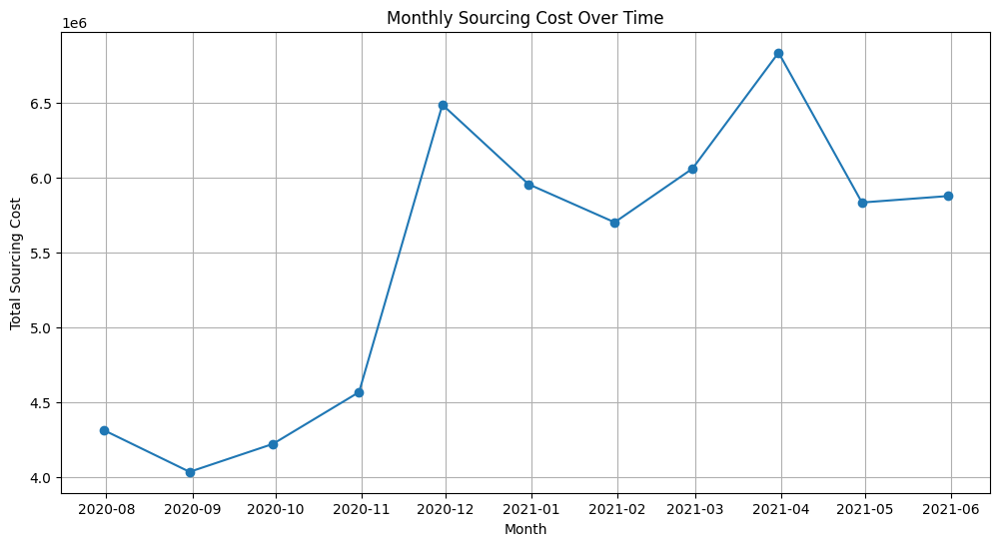

In [22]:
# Ensure 'Month of Sourcing' is in datetime format, specifying the format explicitly
train_data['Month of Sourcing'] = pd.to_datetime(train_data['Month of Sourcing'], format='%b-%y')

# Group data by month and calculate total sourcing cost for each month
monthly_sourcing_cost = train_data.groupby(pd.Grouper(key='Month of Sourcing', freq='M'))['Sourcing Cost'].sum()

# Plotting time series plot
plt.figure(figsize=(12, 6))
plt.plot(monthly_sourcing_cost.index, monthly_sourcing_cost.values, marker='o', linestyle='-')
plt.title('Monthly Sourcing Cost Over Time')
plt.xlabel('Month')
plt.ylabel('Total Sourcing Cost')
plt.grid(True)
plt.show()


In [23]:
# Handle outliers using winsorization
from scipy.stats.mstats import winsorize

In [24]:
# Winsorize Sourcing Cost column to handle outliers
train_data['Sourcing Cost'] = winsorize(train_data['Sourcing Cost'], limits=[0.05, 0.05])

# **Gradient Boosting Regressor**

In [25]:
# Data Preprocessing - Handle categorical variables
# Convert categorical variables into numerical format using one-hot encoding
train_data_encoded = pd.get_dummies(train_data.drop(columns=['Sourcing Cost']), drop_first=True)  # Drop_first to avoid dummy variable trap
test_data_encoded = pd.get_dummies(test_data.drop(columns=['Sourcing Cost']), drop_first=True)

# Ensure that both datasets have the same columns after one-hot encoding
common_columns = set(train_data_encoded.columns) & set(test_data_encoded.columns)
#train_data_encoded = train_data_encoded[common_columns]
train_data_encoded = train_data_encoded[list(common_columns)]
#test_data_encoded = test_data_encoded[common_columns]
test_data_encoded = test_data_encoded[list(common_columns)]

In [26]:
# Model Training
# Initialize and train the Gradient Boosting Regressor model
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(train_data_encoded, train_data['Sourcing Cost'])

GradientBoostingRegressor(random_state=42)

In [27]:
# Model Evaluation
# Evaluate the model on the training data (since we don't have a separate validation set)
train_predictions = gb_model.predict(train_data_encoded)
train_mae = mean_absolute_error(train_data['Sourcing Cost'], train_predictions)
train_mse = mean_squared_error(train_data['Sourcing Cost'], train_predictions)
print("\nTraining Set Mean Absolute Error (MAE):", train_mae)
print("Training Set Mean Squared Error (MSE):", train_mse)


Training Set Mean Absolute Error (MAE): 18.465300496871823
Training Set Mean Squared Error (MSE): 715.614925283426


In [28]:
#Forecasting for June 2021
# Use the trained model to forecast June 2021 values
test_predictions = gb_model.predict(test_data_encoded)

In [29]:
# Evaluate the performance metrics (e.g., MAE, MSE) on the test data
test_mae = mean_absolute_error(test_data['Sourcing Cost'], test_predictions)
test_mse = mean_squared_error(test_data['Sourcing Cost'], test_predictions)
print("\nTest Set Mean Absolute Error (MAE):", test_mae)
print("Test Set Mean Squared Error (MSE):", test_mse)


Test Set Mean Absolute Error (MAE): 22.497827741538742
Test Set Mean Squared Error (MSE): 1095.1645962761024


In [30]:
# Display forecasted values
print("\nForecasted Sourcing Cost for June 2021:")
print(test_predictions)


Forecasted Sourcing Cost for June 2021:
[133.81726538 137.93947125 143.0114571  136.20285067 153.86005253
 161.19083681 120.15993721  86.43772784 136.20764391 136.06842432
 136.06842432 133.81726538 109.17030901 133.81726538 133.81726538
 135.22987078 135.22987078 139.66465956 139.66465956 143.65508449
 143.83678022 133.81726538 133.81726538  36.6821888   71.41832286
  53.68113218  49.54517038  49.54517038  32.86287752 167.00228308
 167.00228308 154.6684167   47.53991572  34.2153749   55.92441105
 142.04309474 147.11508058 140.67450167 140.67450167 110.52830676
  87.31266493 124.08993351 161.1550146  158.49164891 140.70784681
  60.59260571 137.09095666 137.09095666 137.09095666  81.40312342
  81.40312342 140.17179073 111.44045357 111.44045357 166.24756899
 138.28891637 138.28891637 165.19326    160.69149365 138.28891637
 138.28891637 138.28891637 138.28891637 138.28891637 138.28891637
 139.70152178 139.70152178 144.13631055 144.13631055 147.768568
 138.28891637  86.35821798  68.606181

# **RandomForestRegressor**

In [31]:
# Creating a RandomForestRegressor model with a specified random state for reproducibility
rf_model = RandomForestRegressor(random_state=42)

# Fitting the RandomForestRegressor model to the encoded training data and the target variable 'Sourcing Cost'
rf_model.fit(train_data_encoded, train_data['Sourcing Cost'])

RandomForestRegressor(random_state=42)

In [32]:
# Model Evaluation
# Evaluate the model on the training data (since we don't have a separate validation set)
train_predictions = rf_model.predict(train_data_encoded)
train_mae = mean_absolute_error(train_data['Sourcing Cost'], train_predictions)
train_mse = mean_squared_error(train_data['Sourcing Cost'], train_predictions)
print("\nTraining Set Mean Absolute Error (MAE):", train_mae)
print("Training Set Mean Squared Error (MSE):", train_mse)


Training Set Mean Absolute Error (MAE): 14.56376755197424
Training Set Mean Squared Error (MSE): 580.4222492132811


In [33]:
# Evaluate the Random Forest Regressor model on the test data
rf_test_predictions = rf_model.predict(test_data_encoded)
rf_test_mae = mean_absolute_error(test_data['Sourcing Cost'], rf_test_predictions)
rf_test_mse = mean_squared_error(test_data['Sourcing Cost'], rf_test_predictions)
print("\nRandom Forest Test Set Mean Absolute Error (MAE):", rf_test_mae)
print("Random Forest Test Set Mean Squared Error (MSE):", rf_test_mse)


Random Forest Test Set Mean Absolute Error (MAE): 18.68012695842089
Random Forest Test Set Mean Squared Error (MSE): 1126.73499715462


In [34]:
# Display forecasted values
print("\nRandom Forest Forecasted Sourcing Cost for June 2021:")
print(rf_test_predictions)


Random Forest Forecasted Sourcing Cost for June 2021:
[102.87935323 145.51715698 148.42100331 142.54200709 162.73930957
 171.42572604  39.74530169  83.47046877 143.09023382 141.74853883
 141.74853883 133.76152294  94.59741298 141.00890759 141.14157956
 153.35857291 151.80209222 142.53597198 142.53597198 143.97075819
 146.21763328 142.75998242 146.79703486  28.83249967  76.94555613
  33.99870489  27.33649179  31.26819643  24.53709074 179.6975189
 179.6975189  162.73386356  32.44523383  25.79349156  68.90776988
 143.72863258 153.85027676 143.26384066 142.82617293 103.43322687
  58.31255906 107.77716668 171.1809707  165.30474407  98.6006133
  39.44411202 179.56951457 141.39751834 141.39751834  73.68008054
  73.68008054 143.22792399  60.8833484   60.8833484  180.41900819
 159.9723077  159.9723077  183.05974851 173.04527828 140.62847741
 131.73108217 143.67797559 143.67797559 142.74082292 141.81112077
 142.20273941 142.40210128 146.47979812 146.47979812 148.73402078
 144.42184911 105.07941

# **XGBRegressor**

In [35]:
# Creating an XGBRegressor model with a specified random state for reproducibility
xgb_model = XGBRegressor(random_state=42)

# Fitting the XGBRegressor model to the encoded training data and the target variable 'Sourcing Cost'
xgb_model.fit(train_data_encoded, train_data['Sourcing Cost'])

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [36]:
# Making predictions on the training data using the trained XGBRegressor model
train_predictions = xgb_model.predict(train_data_encoded)

# Calculating Mean Absolute Error (MAE) between actual 'Sourcing Cost' and predicted values on the training set
train_mae = mean_absolute_error(train_data['Sourcing Cost'], train_predictions)

# Calculating Mean Squared Error (MSE) between actual 'Sourcing Cost' and predicted values on the training set
train_mse = mean_squared_error(train_data['Sourcing Cost'], train_predictions)

# Printing the calculated MAE and MSE for the training set
print("\nTraining Set Mean Absolute Error (MAE):", train_mae)
print("Training Set Mean Squared Error (MSE):", train_mse)


Training Set Mean Absolute Error (MAE): 14.521744865916451
Training Set Mean Squared Error (MSE): 583.0906167302958


In [37]:
# Evaluate the XGBoost model on the test data
xgb_test_predictions = xgb_model.predict(test_data_encoded)
xgb_test_mae = mean_absolute_error(test_data['Sourcing Cost'], xgb_test_predictions)
xgb_test_mse = mean_squared_error(test_data['Sourcing Cost'], xgb_test_predictions)
print("\nXGBoost Test Set Mean Absolute Error (MAE):", xgb_test_mae)
print("XGBoost Test Set Mean Squared Error (MSE):", xgb_test_mse)


XGBoost Test Set Mean Absolute Error (MAE): 18.699177061716718
XGBoost Test Set Mean Squared Error (MSE): 1115.800621269473


In [38]:
# Display forecasted values
print("\nXGBoost Forecasted Sourcing Cost for June 2021:")
print(xgb_test_predictions)


XGBoost Forecasted Sourcing Cost for June 2021:
[113.237076 144.54173  147.58952  141.57301  161.59479  170.43472
  38.328987  79.23693  142.69928  141.22786  141.22786  132.8835
  93.622795 139.66687  139.97237  153.08994  151.15459  142.08426
 142.08426  143.37347  145.50226  141.94774  145.68188   28.519297
  76.91754   34.110485  27.426817  31.429708  24.444563 179.38855
 179.38855  162.49684   32.288307  25.868345  68.41849  143.69562
 153.82108  143.28096  142.85013  103.43125   58.98188  108.16602
 171.02107  165.16406  100.30505   39.81503  179.28366  141.24678
 141.24678   73.57152   73.57152  143.0463    62.19729   62.19729
 179.82195  159.2745   159.2745   182.29866  172.56691  140.46994
 134.40332  143.29494  143.29494  142.65913  141.75685  142.21657
 142.4174   146.5147   146.5147   148.88971  144.37756  104.90588
  72.37531   64.24068   38.0774    49.795708  26.701986 131.51634
 104.86913   36.612885  19.005394  40.343174 155.81813  106.301186
  61.59038  104.87101  104

# **DecisionTreeRegressor**

In [39]:
# Initialize and train Decision Tree Regressor
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(train_data_encoded, train_data['Sourcing Cost'])

DecisionTreeRegressor(random_state=42)

In [40]:
# Making predictions on the training data using the trained DecisionTreeRegressor model
train_predictions = dt_model.predict(train_data_encoded)

# Calculating Mean Absolute Error (MAE) between actual 'Sourcing Cost' and predicted values on the training set
train_mae = mean_absolute_error(train_data['Sourcing Cost'], train_predictions)

# Calculating Mean Squared Error (MSE) between actual 'Sourcing Cost' and predicted values on the training set
train_mse = mean_squared_error(train_data['Sourcing Cost'], train_predictions)

# Printing the calculated MAE and MSE for the training set
print("\nTraining Set Mean Absolute Error (MAE):", train_mae)
print("Training Set Mean Squared Error (MSE):", train_mse)


Training Set Mean Absolute Error (MAE): 14.563107264330938
Training Set Mean Squared Error (MSE): 580.4213510924527


In [41]:
# Evaluate Decision Tree model on test set
dt_test_predictions = dt_model.predict(test_data_encoded)
dt_test_mae = mean_absolute_error(test_data['Sourcing Cost'], dt_test_predictions)
dt_test_mse = mean_squared_error(test_data['Sourcing Cost'], dt_test_predictions)

# Print evaluation results
print("\nDecision Tree Test Set Mean Absolute Error (MAE):", dt_test_mae)
print("Decision Tree Test Set Mean Squared Error (MSE):", dt_test_mse)


Decision Tree Test Set Mean Absolute Error (MAE): 18.694130113554127
Decision Tree Test Set Mean Squared Error (MSE): 1128.5478270452688


In [42]:
# Display forecasted values
print("\nDecision Tree Forecasted Sourcing Cost for June 2021:")
print(dt_test_predictions)


Decision Tree Forecasted Sourcing Cost for June 2021:
[102.89473414 145.5315092  148.41856034 142.54623574 162.72844005
 171.44283582  39.74492363  83.55686922 143.11136715 141.7191713
 141.7191713  133.76270757  94.59775947 141.01823772 141.13400608
 153.37940537 151.80192669 142.53255587 142.53255587 143.96778684
 146.21255881 142.75214334 146.79514425  28.79962054  76.94632836
  33.99244803  27.30545639  31.26457697  24.53865412 179.71738176
 179.71738176 162.73688454  32.53177702  25.79175698  68.90406467
 143.72422153 153.84724842 143.25768112 142.82991993 103.40420253
  58.3523266  107.7833342  171.16846857 165.31606071  98.89441125
  39.4445339  179.57544118 141.37412181 141.37412181  73.68068884
  73.68068884 143.21454412  60.64869732  60.64869732 180.44616766
 160.16532123 160.16532123 183.06926975 173.33666667 140.62158152
 131.79144068 143.67245547 143.67245547 142.74480119 141.8237862
 142.2193054  142.4031465  146.50986712 146.50986712 148.73594828
 144.41721669 105.06073

# **Compared and explain the different approaches we have considered:**

###**Gradient Boosting Regressor:**

This approach constructs trees successively, with each one correcting the faults of the previous one. Its sequential structure makes it more strong and less prone to overfitting. However, it can be computationally expensive and hyperparameter dependent.

###**Random Forest Regressor:**

This method combines many decision trees and averages their predictions to reduce overfitting and improve stability. It is less susceptible to overfitting than a single decision tree.

###**XGBoost:**

It is similar to Gradient Boosting but has been tuned for performance. It is renowned for its speed and performance, frequently beating other algorithms. It is commonly utilized in data science competitions and real-world applications.

###**Decision Tree Regressor:**

Using no ensemble approaches, this method creates a single decision tree. It's easily understood and straightforward, but it might overfit, particularly if the tree depth isn't kept under control.



# **Explaining the final approach that we have taken and why:**

The ultimate strategy is determined by a number of variables, including the size, complexity, and performance requirements of the dataset as well as computer resources:

### **Gradient Boosting Regressor:**

In comparison to other models, it performs reasonably well with reduced training set MAE and MSE. To improve performance, hyperparameters may need to be adjusted.

### **Random Forest Regressor:**

It provides competitive performance with comparatively lower training set MAE and significantly higher test set MAE. It trains more quickly overall and is less susceptible to hyperparameter changes.

### **XGBoost:**

It functions similarly to Gradient Boosting, however at default settings, it may provide faster training and better results.

### **Decision Tree Regressor:**

Compared to ensemble techniques like Random Forest or Gradient Boosting, it has a greater tendency to overfit the data, despite being straightforward and easy to understand.




## **In light of computational efficiency and performance measures, XGBoost or Gradient Boosting Regressor may be the chosen final strategy. XGBoost might be better if there are limited computational resources available or if faster training is required. Gradient Boosting, however, might be a superior option if interpretability is important or if fine-tuning is required.**